# Классификации жанров музыки

## Описание задачи
**Бизнес задача** - правильно классифицировать новые музыкальные треки, чтобы улучшить работу рекомендательной системы музыкального серфиса.

**Данные** - датасет, в котором собраны некоторые характеристики музыкальных произведений и их жанры. 

**Техническая задача** - разработать модель, позволяющую классифицировать музыкальные произведения по жанрам.

## Загрузка данных

In [ ]:
!pip install ydata_profiling
!pip install xgboost
!pip install catboost
!pip install shap

In [52]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
from sklearn.model_selection import cross_val_score, RandomizedSearchCV 
from sklearn.ensemble import RandomForestClassifier
from sklearn.dummy import DummyClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.preprocessing import OneHotEncoder, StandardScaler, LabelEncoder, PolynomialFeatures, MinMaxScaler
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer, SimpleImputer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    accuracy_score,
    confusion_matrix,
    recall_score,
    precision_score,
    f1_score,
    roc_curve,
    roc_auc_score
)
from sklearn.ensemble import StackingClassifier
import ydata_profiling
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
import shap

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
pd.options.mode.chained_assignment = None  # default='warn'

In [33]:
df_train = pd.read_csv('kaggle_music_genre_train.csv')
df_test = pd.read_csv('kaggle_music_genre_test.csv')

In [4]:
df_train.head()

,instance_id,track_name,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,obtained_date,valence,music_genre
0,25143.0,Highwayman,0.4800,0.670,182653.0,0.351,0.017600,D,0.115,-16.842,Major,0.0463,101.384,4-Apr,0.450,Country
1,26091.0,Toes Across The Floor,0.2430,0.452,187133.0,0.670,0.000051,A,0.108,-8.392,Minor,0.0352,113.071,4-Apr,0.539,Rock
2,87888.0,First Person on Earth,0.2280,0.454,173448.0,0.804,0.000000,E,0.181,-5.225,Minor,0.3710,80.980,4-Apr,0.344,Alternative
3,77021.0,No Te Veo - Digital Single,0.0558,0.847,255987.0,0.873,0.000003,G#,0.325,-4.805,Minor,0.0804,116.007,4-Apr,0.966,Hip-Hop
4,20852.0,Chasing Shadows,0.2270,0.742,195333.0,0.575,0.000002,C,0.176,-5.550,Major,0.0487,76.494,4-Apr,0.583,Alternative


In [5]:
df_test.head()

,instance_id,track_name,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,obtained_date,valence
0,48564,Low Class Conspiracy,0.301000,0.757,146213.0,0.679,0.00000,A#,0.3030,-7.136,Minor,0.3560,90.361,4-Apr,0.895
1,72394,The Hunter,0.538000,0.256,240360.0,0.523,0.00832,G#,0.0849,-5.175,Major,0.0294,78.385,4-Apr,0.318
2,88081,Hate Me Now,0.005830,0.678,284000.0,0.770,0.00000,A,0.1090,-4.399,Minor,0.2220,90.000,4-Apr,0.412
3,78331,Somebody Ain't You,0.020300,0.592,177354.0,0.749,0.00000,B,0.1220,-4.604,Major,0.0483,160.046,4-Apr,0.614
4,72636,Sour Mango,0.000335,0.421,-1.0,0.447,0.01480,D,0.0374,-8.833,Major,0.2020,73.830,4-Apr,0.121


## Исследовательский анализ данных

In [6]:
ydata_profiling.ProfileReport(df_train)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

В ходе анализа отчета, сгенерированного бибилиотекой `pandas_profiling` можно выявить следующие особенности исходных данных:
1. `instance_id` - поле, содержащее уникальные ID композиции, не понадобиться для обучения модели и его стоит удалиить, т.к. оно не несет в себе никакой информации для моделей машинного обучения
2. `track_name` содержит название композиции и так же напрямую не пригодится для обучения
3. Признак `energy` сильно коррелирует с признаком`acousticness` и `loudness`, что может негативно сказаться на качестве обучения модели; необходимо будет удалить 2 из 3 признаков и оставить только один
4. `obtained_date` - дата загрузки композиции на сервис и скорее всего не несет никакой информации о жанре композиции
5. Признаки базовая нота произведения `key`, модальносить трека `mode` и темп `tempo` содержат 3.6%/2.5%/2.2% пропущенных значений - стоит поэксперементировать с заменой пропусков на медианное значение или с удалением записий, не содержащих значений в этих столбцах
6. Признак `duration_ms` содержит 10% отрицательных значений -1, что скорее всего говорит об отсутсвии данных о длительности данных композиций. Стоит поэкперементировать с удалением данного признака и с заменой на медианное значение

## Предобработка данных

In [7]:
df_train.shape

(20394, 16)

Заменим значения -1 в столбце `duration_ms` на среднее значение по столбцу

In [34]:
df_train.loc[df_train['duration_ms'] < 0, 'duration_ms'] = df_train['duration_ms'].mean()
df_test.loc[df_test['duration_ms'] < 0, 'duration_ms'] = df_test['duration_ms'].mean()

In [9]:
df_train.shape

(20394, 16)

В данной работе мы не планируем семантически анализировать названия композиций и каким-либо образом использовать данную информацию для обучения модели, т.к. это выходит за рамки данной работы. Тем не менее, информация о количестве слов, содержащихся в названии композиции - легкий для извлечения признак и стоит попробовать использовать его для обучения.

In [35]:
df_train['words_count'] = df_train['track_name'].apply(lambda name: len(name.split()))
df_test['words_count'] = df_test['track_name'].apply(lambda name: len(name.split()))

Удалим признаки, не несущие в себе нужной информации для обучения модели - уникальный номер, название, а так же дату публикации композиции

In [36]:
df_train = df_train.drop(['instance_id', 'track_name', 'obtained_date'], axis=1)

Избавимся от дубликатов в тренировочных данных

In [37]:
df_train.duplicated().sum()

4

In [38]:
df_train = df_train.drop_duplicates()

In [16]:
df_train.columns

Index(['acousticness', 'danceability', 'duration_ms', 'energy',
       'instrumentalness', 'key', 'liveness', 'loudness', 'mode',
       'speechiness', 'tempo', 'valence', 'music_genre', 'words_count'],
      dtype='object')

Выделем целевую переменную - жанр композиции, а все остальные столбцы будем считать признаками

In [39]:
Y_train = df_train['music_genre']
X_train = df_train.drop('music_genre', axis=1)

Т.к. тестовые данные не содержат целевую переменную, весь датафрейм является признаками

In [40]:
X_test = df_test

### Pipeline обработки данных

Для упрощения операция предобработки, сгруппируем их в пайплайн, которые можно будет выполнить как на тренировочных, так и на тестовых данных

In [41]:
cat_vars = ['key', 'mode']
num_vars = ['acousticness', 'danceability', 'duration_ms', 'energy', 'instrumentalness', 'liveness', 'loudness','speechiness', 'tempo', 'valence', 'words_count']

In [42]:
processing_pipe = Pipeline([
    ('transform_columns', ColumnTransformer([
        ('numerical', Pipeline([
            ("imputer", IterativeImputer(max_iter=10, random_state=0)), # заполнение пропусков
            ("scaler", StandardScaler()), # масштабирование числовых признаков
            ("polynomial", PolynomialFeatures(2)) # генерация новых полиномиальных признаков
        ]), num_vars),
        ('categorical', OneHotEncoder(), cat_vars), # кодирование категориальных признаков
    ]))
])

In [43]:
X_train_processed = processing_pipe.fit_transform(X_train)
X_test_processed = processing_pipe.fit_transform(X_test)

In [22]:
processing_pipe.steps[0][1].get_feature_names_out()

array(['numerical__1', 'numerical__acousticness',
       'numerical__danceability', 'numerical__duration_ms',
       'numerical__energy', 'numerical__instrumentalness',
       'numerical__liveness', 'numerical__loudness',
       'numerical__speechiness', 'numerical__tempo', 'numerical__valence',
       'numerical__words_count', 'numerical__acousticness^2',
       'numerical__acousticness danceability',
       'numerical__acousticness duration_ms',
       'numerical__acousticness energy',
       'numerical__acousticness instrumentalness',
       'numerical__acousticness liveness',
       'numerical__acousticness loudness',
       'numerical__acousticness speechiness',
       'numerical__acousticness tempo', 'numerical__acousticness valence',
       'numerical__acousticness words_count', 'numerical__danceability^2',
       'numerical__danceability duration_ms',
       'numerical__danceability energy',
       'numerical__danceability instrumentalness',
       'numerical__danceability live

Закодируем целевую пременную с помощью `LabelEncoder`, т.к. не все модели умеют работать с категориальными значениями целевой переменной

In [23]:
Y_train[:10]

0        Country
1           Rock
2    Alternative
3        Hip-Hop
4    Alternative
5          Blues
6           Rock
7           Jazz
8           Jazz
9     Electronic
Name: music_genre, dtype: object

In [24]:
target_encoder = LabelEncoder()
Y_train_processed = target_encoder.fit_transform(Y_train)
Y_train_processed[:10]

array([4, 9, 0, 6, 0, 2, 9, 7, 7, 5])

In [25]:
target_encoder.inverse_transform(Y_train_processed)[:10]

array(['Country', 'Rock', 'Alternative', 'Hip-Hop', 'Alternative',
       'Blues', 'Rock', 'Jazz', 'Jazz', 'Electronic'], dtype=object)

**На данном этапе наши данные готовы к обучению моделей: мы удалили лишние признаки, избавились от дубликатов, заполнили пропуски, а так же сгенерировали новые признаки. В дополнение, мы создали пайплайн предобработки данных, который можно в дальнейшем можно комбинировать с пайплайнами для тренировки моделей**

## Выбор модели

В данном разделе мы попробуем натренировать различные модели машиноого обучения, подходящие для задачи многоклассовой классификации, с параметрами по умолчанию и посмотрим на базовые значения метрики f1 для этих моделей

### Случайная модель

In [71]:
dummy_model = DummyClassifier(strategy='uniform', random_state=12345)
dummy_model.fit(X_train_processed, Y_train_processed)
f1_score(Y_train_processed, dummy_model.predict(X_train_processed), average='micro')

0.10044139283962726

### Логистическая регрессия

In [55]:
logreg = LogisticRegression(solver='newton-cg', multi_class='multinomial')
scores = cross_val_score(logreg, X_train_processed, Y_train_processed, cv=5, scoring='f1_macro')
print(scores.sum()/len(scores))

0.4259520333358161


### Случайный лес

In [56]:
random_forest_model = RandomForestClassifier(random_state=12345)
scores = cross_val_score(random_forest_model, X_train_processed, Y_train_processed, cv=5, scoring='f1_macro')
print(scores.sum()/len(scores))

0.4283316680929382


### Naive Bayes

In [57]:
gnb = GaussianNB()
scores = cross_val_score(gnb, X_train_processed, Y_train_processed, cv=5, scoring='f1_macro')
print(scores.sum()/len(scores))

0.28707955913002603


### XGBoost

In [58]:
xgb_model = XGBClassifier(objective='multi:softprob')
scores = cross_val_score(xgb_model, X_train_processed, Y_train_processed, cv=5, scoring='f1_macro')
print(scores.sum()/len(scores))

0.4433639770966889


### CatBoost

In [59]:
clf = CatBoostClassifier(loss_function='MultiClass', learning_rate=0.1, silent=True)
scores = cross_val_score(clf, X_train_processed, Y_train_processed, cv=5, scoring='f1_macro')
print(scores.sum()/len(scores))

0.4469223055746404


<b>Основываясь на предварительных результатах точности работы различных моделей, в дальнейшем поработаем с ансамблем из трех моделей, показавших наилучшую точность: 
- XGBoost
- CatBoost
- Случайный Лес
</b>

## Стэкинг

In [72]:
pipe_lr = Pipeline([
    ("scaler", StandardScaler()),
    ("classifier", LogisticRegression(max_iter=100))
])
pipe_rf = Pipeline([
    ("preprocessing", processing_pipe),
    ("training", RandomForestClassifier(class_weight='balanced', random_state=12345))
])
pipe_xgb = Pipeline([
    ("preprocessing", processing_pipe),
    ("training", XGBClassifier(objective='multi:softprob', learning_rate=0.02, max_depth=7, min_child_weight=12, n_estimators=180))
])
pipe_catb = Pipeline([
    ("preprocessing", processing_pipe),
    ("training", CatBoostClassifier(iterations=100, depth=6, learning_rate=0.1, loss_function='MultiClass', silent=True))
])

stacked_model = StackingClassifier(
    estimators=[("random_forest", pipe_rf), ("xgboost", pipe_xgb), ("catboost", pipe_catb)], 
    final_estimator=pipe_lr,
    n_jobs=-1,
    verbose=3
)

In [ ]:
scores = cross_val_score(stacked_model, X_train, Y_train_processed, cv=5, scoring='f1_macro')

In [75]:
print(scores.sum()/len(scores))

0.47070858738986915


## Подбор гиперпараметров

In [ ]:
# params = [{
#     'random_forest__preprocessing__transform_columns__numerical__scaler': [StandardScaler(), MinMaxScaler()],
#     'random_forest__preprocessing__transform_columns__numerical__imputer': [None, SimpleImputer(), IterativeImputer(max_iter=10, random_state=12345)],
#     'random_forest__preprocessing__transform_columns__numerical__polynomial': [None, PolynomialFeatures(2), PolynomialFeatures(3)],
#     'random_forest__training__class_weight': [None, 'balanced'],
#     'random_forest__training__n_estimators': [200, 500],
#     'random_forest__training__max_features': ['sqrt', 'log2'],
#     'random_forest__training__max_depth': [4,5,6,7,8],
#     'random_forest__training__criterion': ['gini', 'entropy'],
    
#     'xgboost__preprocessing__transform_columns__numerical__scaler': [StandardScaler(), MinMaxScaler()],
#     'xgboost__preprocessing__transform_columns__numerical__imputer': [None, SimpleImputer(), IterativeImputer(max_iter=10, random_state=12345)],
#     'xgboost__preprocessing__transform_columns__numerical__polynomial': [None, PolynomialFeatures(2), PolynomialFeatures(3)],
#     'xgboost__training__learning_rate': [0.02, 0.2, 0.7],
#     'xgboost__training__max_depth': [7,10,14],
#     'xgboost__training__n_estimators': [50,130,180],
#     'xgboost__training__min_child_weight': [6,12,20],
    
#     'catboost__preprocessing__transform_columns__numerical__scaler': [StandardScaler(), MinMaxScaler()],
#     'catboost__preprocessing__transform_columns__numerical__imputer': [None, SimpleImputer(), IterativeImputer(max_iter=10, random_state=12345)],
#     'catboost__preprocessing__transform_columns__numerical__polynomial': [None, PolynomialFeatures(2), PolynomialFeatures(3)],
#     'catboost__training__iterations':[100,200],
#     'catboost__training__depth': [4,6,10],
#     'catboost__training__learning_rate': [0.1, 0.2],
    
#     'final_estimator__classifier__solver': ['lbfgs', 'newton-cg'],
#     'final_estimator__classifier__multi_class': ['auto', 'multinomial']
# }]
# stacked_grid = RandomizedSearchCV(
#     estimator=stacked_model, 
#     param_distributions=params, 
#     cv=5, 
#     refit=True, 
#     verbose=1,
#     n_iter=10
# )

In [ ]:
# stacked_grid.fit(X_train, Y_train_processed)

In [ ]:
# stacked_grid.best_score_

In [ ]:
# stacked_grid.best_params_

## Результаты работы модели

In [44]:
test_predict = stacked_model.predict(X_test)
test_predict[:10]

array([8, 2, 8, 4, 8, 7, 0, 4, 4, 4])

In [45]:
test_predict_decoded = target_encoder.inverse_transform(test_predict)
test_predict_decoded[:10]

array(['Rap', 'Blues', 'Rap', 'Country', 'Rap', 'Jazz', 'Alternative',
       'Country', 'Country', 'Country'], dtype=object)

In [46]:
df_results = pd.DataFrame(data={'instance_id':df_test['instance_id'], 'music_genre':test_predict_decoded}).set_index('instance_id')
df_results.head()

,music_genre
instance_id,
48564,Rap
72394,Blues
88081,Rap
78331,Country
72636,Rap


In [ ]:
df_results.to_csv('submission.csv')

# Отчет

## Результаты

В финальной конфигрурации наилучшей модели удалось добиться средней точности по метрике f1 score (micro) на тестовых данных при кросс-валидации с делением исходных данных на 5 частей в **0.47**

## Предобработка

Следующие действия были выполнены над изначальным набором данных на стадии предобработки:
- Пропуски (значения -1) в столбце `duration_ms` были заменены средним по столбцу
- Удалены столбцы `instance_id`, `track_name`, `obtained_date`
- Удалены неявные дубликаты
- Добавлен признак `words_count` - количество слов в названии трека
- Добавлены полиномиальные числовые признаки со степенью полинома 2
- Пропуски в числовых признаках заполнены средними значениями, числовые признаки были масштабированы
- Категориальные признаки были закодированы с помощью `OneHotEncoder`

Схема пайплайна предобработки данных:

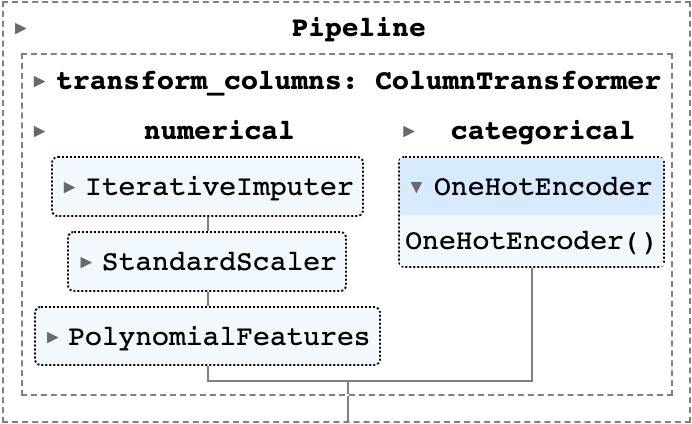

In [76]:
from IPython.display import Image
Image(filename='preprocessing.png') 

## Наилучшая модель

Наилучших результатов удалось добиться на ансабмле из трех моделей: XGBoost, Catboost и Случайный Лес, объединненых с использованием стекинга и логистической регрессией в качестве эстиматора для объединения результатов. 

Схема модели:

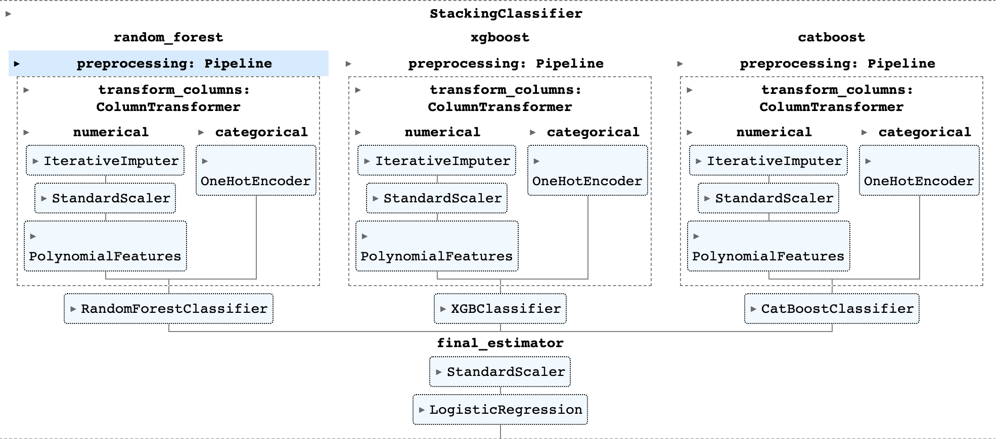

In [77]:
Image(filename='model.png') 